In [15]:
import numpy as np
import cv2
import os
from tqdm import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from torch.amp import GradScaler, autocast
from torch.optim.lr_scheduler import ReduceLROnPlateau
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
import gc
from scipy.ndimage import distance_transform_edt

In [2]:
num_classes=6
H=384
W=576

In [3]:
# Функции для чтения изображений и масок
def read_image(x):
    x = cv2.imread(x, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (W, H), interpolation=cv2.INTER_NEAREST)
    x = x / 255.0
    x = x.astype(np.float32)
    return x

def remap_labels(mask, class_mapping):
    new_mask = np.zeros_like(mask)
    for old_class, new_class in class_mapping.items():
        new_mask[mask == old_class] = new_class
    return new_mask

def read_mask(x, class_mapping):
    x = cv2.imread(x, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (W, H), interpolation=cv2.INTER_NEAREST)
    x = x.astype(np.int32)
    x = remap_labels(x, class_mapping)
    return x

# Функции для получения трансформаций
def get_train_transforms():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=15, shift_limit=0.1, p=0.5, border_mode=0),
        A.RandomBrightnessContrast(p=0.2),
        A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=20, val_shift_limit=15, p=0.5),
        A.GaussNoise(p=0.1),
        A.MotionBlur(p=0.1),
        A.GaussianBlur(p=0.1),
        A.CoarseDropout(max_holes=8, max_height=32, max_width=32, p=0.5),
        A.Resize(height=H, width=W, always_apply=True),
        A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
        ToTensorV2()
    ])

def get_val_transforms():
    return A.Compose([
        A.Resize(height=H, width=W, always_apply=True),
        A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
        ToTensorV2()
    ])

# Класс датасета
class DroneDataset(Dataset):
    def __init__(self, images, masks, class_mapping, transforms=None):
        self.images = images
        self.masks = masks
        self.class_mapping = class_mapping
        self.transforms = transforms

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = cv2.imread(self.images[idx], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks[idx], cv2.IMREAD_GRAYSCALE)

        if self.transforms:
            augmented = self.transforms(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        mask = remap_labels(mask, self.class_mapping)
        mask = torch.tensor(mask, dtype=torch.long)

        return image, mask

In [4]:
# Пути к данным
root_dir = 'D:/UniversityFiles/DroneSemantic/SemanticDroneDataset/'
img_path = root_dir + '/img/'
mask_path = root_dir + '/mask/'

names = list(map(lambda x: x.replace('.jpg', ''), os.listdir(img_path)))

In [5]:
X_trainval, X_test = train_test_split(names, test_size=0.1, random_state=19)
X_train, X_val = train_test_split(X_trainval, test_size=0.2, random_state=19)

# Подготовка списков датасета
y_train = X_train
y_test = X_test
y_val = X_val

img_train = [os.path.join(img_path, f"{name}.jpg") for name in X_train]
mask_train = [os.path.join(mask_path, f"{name}.png") for name in y_train]
img_val = [os.path.join(img_path, f"{name}.jpg") for name in X_val]
mask_val = [os.path.join(mask_path, f"{name}.png") for name in y_val]
img_test = [os.path.join(img_path, f"{name}.jpg") for name in X_test]
mask_test = [os.path.join(mask_path, f"{name}.png") for name in y_test]

print(f"Total Size | {len(X_test + X_val + X_train)} images")
print(f"Train Size | {len(X_train)} images")
print(f"Val Size   | {len(X_val)} images")
print(f"Test Size  | {len(X_test)} images")

Total Size | 400 images
Train Size | 288 images
Val Size   | 72 images
Test Size  | 40 images


In [6]:
class_mapping = {
    0: 0,  # Остальное (unlabeled)
    1: 3,  # Дороги (paved-area)
    2: 1,  # Зоны посадки (dirt)
    3: 1,  # Зоны посадки (grass)
    4: 1,  # Зоны посадки (gravel)
    5: 2,  # Вода (water)
    6: 0,  # Остальное (rocks)
    7: 0,  # Остальное (pool)
    8: 0,  # Остальное (vegetation)
    9: 0,  # Остальное (roof)
    10: 0, # Остальное (wall)
    11: 0, # Остальное (window)
    12: 0, # Остальное (door)
    13: 0, # Остальное (fence)
    14: 0, # Остальное (fence-pole)
    15: 4, # Движущийся (person)
    16: 4, # Движущийся (dog)
    17: 4, # Движущийся (car)
    18: 4, # Движущийся (bicycle)
    19: 0, # Остальное (tree)
    20: 0, # Остальное (bald-tree)
    21: 5, # Маркер (ar-marker)
    22: 0, # Остальное (obstacle)
    23: 0  # Остальное (conflicting)
}

# Аугментация изображений и масок
train_transforms = get_train_transforms()
val_transforms = get_val_transforms()

# Создание датасетов с новым маппингом классов
train_dataset = DroneDataset(img_train, mask_train, class_mapping, transforms=train_transforms)
valid_dataset = DroneDataset(img_val, mask_val, class_mapping, transforms=val_transforms)
test_dataset = DroneDataset(img_test, mask_test, class_mapping, transforms=val_transforms)

In [7]:
# Функция для расчета IoU
def calculate_iou(preds, labels, num_classes):
    iou_list = []
    for cls in range(num_classes):
        intersection = ((preds == cls) & (labels == cls)).sum().item()
        union = ((preds == cls) | (labels == cls)).sum().item()
        if union == 0:
            iou_list.append(np.nan)  # Для случаев, когда класс отсутствует в обоих
        else:
            iou_list.append(intersection / union)
    return np.nanmean(iou_list)

# Функция для расчета MIoU
def calculate_miou(model, loader, num_classes):
    model.eval()
    ious = []
    with torch.no_grad():
        for data in loader:
            images, labels = data
            images, labels = images.cuda(), labels.cuda()
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            iou = calculate_iou(preds.cpu().numpy(), labels.cpu().numpy(), num_classes)
            ious.append(iou)
    mean_iou = np.nanmean(ious)
    return mean_iou

In [8]:
# Функция загрузки чекпоинта
def load_checkpoint(filename='checkpoint.pt'):
    checkpoint = torch.load(filename)
    model.load_state_dict(checkpoint['state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer'])
    scheduler.load_state_dict(checkpoint['scheduler'])
    scaler.load_state_dict(checkpoint['scaler'])
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_losses']
    val_losses = checkpoint['val_losses']
    train_mious = checkpoint['train_mious']
    val_mious = checkpoint['val_mious']
    val_loss_min = min(val_losses) if val_losses else np.Inf
    early_stopping.val_loss_min = val_loss_min
    early_stopping.best_score = -val_loss_min
    return epoch, train_losses, val_losses, train_mious, val_mious, val_loss_min

In [9]:
# Класс ранней остановки
class EarlyStopping:
    def __init__(self, patience=7, verbose=False, delta=0, val_loss_min=np.Inf):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = -val_loss_min
        self.early_stop = False
        self.val_loss_min = val_loss_min
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping счётчик: {self.counter} из {self.patience}. Валидационные потери: {val_loss}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        if self.verbose:
            print(f'Валидационные потери уменьшились ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Сохраняем модель ...')

        state = {
            'epoch': epoch + 1,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'scheduler': scheduler.state_dict(),
            'scaler': scaler.state_dict(),
            'train_losses': train_losses,
            'val_losses': val_losses,
            'train_mious': train_mious,
            'val_mious': val_mious,
        }

        torch.save(state, 'checkpoint.pt')
        torch.save(model.state_dict(), 'checkpoint_weights.pth')
        self.val_loss_min = val_loss

In [10]:
# Создание модели
model = smp.DeepLabV3Plus(
    encoder_name="mobilenet_v2",       # энкодер, например, mobilenet_v2 или mobilenet_v3
    encoder_weights="imagenet",        # предобученные веса энкодера
    in_channels=3,                     # количество каналов во входных данных
    classes=num_classes                # количество классов
)

# Перемещение модели на GPU, если доступно
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

if not torch.cuda.is_available():
    print("Предупреждение: CUDA недоступен. Будет использован ЦПУ.")

model = model.to(device)

In [16]:
# Параметры обучения
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
scaler = GradScaler('cuda')
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
early_stopping = EarlyStopping(patience=10, verbose=True)

c:\Users\zephyr\JupyterNotebook\NIRDiploma\.venv\Lib\site-packages\torch\optim\lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [17]:
num_epochs = 75
batch_size = 8
accumulation_steps = 4  # Количество шагов для накопления градиентов

In [18]:
# Создание датасетов с новым размером изображения
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)

# Списки для сохранения истории потерь и метрик
train_losses = []
val_losses = []
train_mious = []
val_mious = []

In [19]:
# Загрузка существующей модели, если она есть
# model_path = 'final_model.pt'
# model_path = 'checkpoint.pt'
model_path = 'checkpointDeep69Classes6.pt'

if os.path.exists(model_path):
    print("Loading existing model")
    start_epoch, train_losses, val_losses, train_mious, val_mious, val_loss_min = load_checkpoint(model_path)
else:
    print("No existing model found, starting from scratch")
    start_epoch, train_losses, val_losses, train_mious, val_mious, val_loss_min = 0, [], [], [], [], np.Inf

Loading existing model


C:\Users\zephyr\AppData\Local\Temp\ipykernel_10500\3535884897.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(filename)


In [ ]:
# Цикл обучения с использованием tqdm для отображения прогресса и накоплением градиентов
for epoch in range(start_epoch, num_epochs):
    model.train()
    running_loss = 0.0
    optimizer.zero_grad()

    with tqdm(total=len(train_loader), desc=f"Epoch {epoch + 1}/{num_epochs}", unit="batch") as pbar:
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data
            inputs, labels = inputs.cuda(non_blocking=True), labels.cuda(non_blocking=True)

            # Использование смешанной точности
            with autocast():
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss = loss / accumulation_steps  # Делим потери на количество шагов накопления

            scaler.scale(loss).backward()  # Масштабирование потерь для обратного прохода

            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)  # Шаг оптимизации
                scaler.update()  # Обновление смешанной точности
                optimizer.zero_grad()

            running_loss += loss.item()
            pbar.set_postfix(loss=running_loss / (i + 1))
            pbar.update(1)

    train_losses.append(running_loss / len(train_loader))
    train_miou = calculate_miou(model, train_loader, num_classes)
    train_mious.append(train_miou)

    # Проверка валидационной ошибки и метрик
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for data in valid_loader:
            images, labels = data
            images, labels = images.cuda(non_blocking=True), labels.cuda(non_blocking=True)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

    val_losses.append(val_loss / len(valid_loader))
    val_miou = calculate_miou(model, valid_loader, num_classes)
    val_mious.append(val_miou)
    scheduler.step(val_loss / len(valid_loader))
    early_stopping(val_loss / len(valid_loader), model)

    # Сохранение параметров и метрик модели
    state = {
        'epoch': epoch + 1,
        'state_dict': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'scheduler': scheduler.state_dict(),
        'scaler': scaler.state_dict(),
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_mious': train_mious,
        'val_mious': val_mious,
    }

    if early_stopping.early_stop:
        print("Early stopping")
        break

    torch.save(model.state_dict(), 'checkpoint_weights1.pth')
    
if not early_stopping.early_stop:
    print("Saving final model")
    torch.save(state, 'final_model.pt')

print('Finished Training')

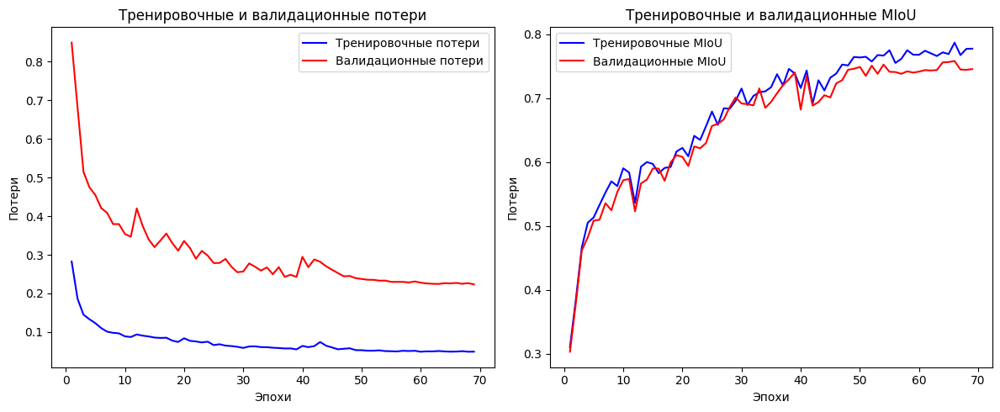

In [20]:
# Функция для построения кривых обучения
def plot_learning_curves(train_losses, val_losses, train_mious, val_mious):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Потери
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, 'b', label='Тренировочные потери')
    plt.plot(epochs, val_losses, 'r', label='Валидационные потери')
    plt.title('Тренировочные и валидационные потери')
    plt.xlabel('Эпохи')
    plt.ylabel('Потери')
    plt.legend()

    # MIoU
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_mious, 'b', label='Тренировочные MIoU')
    plt.plot(epochs, val_mious, 'r', label='Валидационные MIoU')
    plt.title('Тренировочные и валидационные MIoU')
    plt.xlabel('Эпохи')
    plt.ylabel('Потери')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Построение кривых обучения после завершения обучения
plot_learning_curves(train_losses, val_losses, train_mious, val_mious)

In [21]:
# Расчет MIoU на тестовом наборе
miou = calculate_miou(model, test_loader, num_classes)
print(f'Mean IoU (MIoU): {miou:.4f}')

Mean IoU (MIoU): 0.8011


In [15]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Функция для расчета Pixel Accuracy (PA) и Mean Pixel Accuracy (MPA)
def calculate_pa_mpa(preds, labels, num_classes):
    pixel_accuracy = (preds == labels).sum() / (labels.numel())
    
    class_accuracies = []
    for cls in range(num_classes):
        class_pixels = (labels == cls)
        if class_pixels.sum() == 0:
            class_accuracies.append(np.nan)
        else:
            class_accuracies.append((preds[class_pixels] == cls).sum() / class_pixels.sum())
    mean_pixel_accuracy = np.nanmean(class_accuracies)
    
    return pixel_accuracy, mean_pixel_accuracy

# Функция для расчета Precision, Recall и F1-Score для каждого класса
def calculate_precision_recall_f1(model, loader, num_classes):
    model.eval()
    preds_list = []
    labels_list = []
    
    with torch.no_grad():
        for data in loader:
            images, labels = data
            images, labels = images.cuda(), labels.cuda()
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            preds_list.append(preds.cpu().numpy().flatten())
            labels_list.append(labels.cpu().numpy().flatten())
    
    preds_array = np.concatenate(preds_list)
    labels_array = np.concatenate(labels_list)
    
    precision = precision_score(labels_array, preds_array, average=None, labels=range(num_classes))
    recall = recall_score(labels_array, preds_array, average=None, labels=range(num_classes))
    f1 = f1_score(labels_array, preds_array, average=None, labels=range(num_classes))
    
    return precision, recall, f1

# Расчет дополнительных метрик на тестовом наборе
def evaluate_model(model, loader, num_classes):
    model.eval()
    pixel_accuracies = []
    mean_pixel_accuracies = []
    
    with torch.no_grad():
        for data in loader:
            images, labels = data
            images, labels = images.cuda(), labels.cuda()
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            pa, mpa = calculate_pa_mpa(preds.cpu(), labels.cpu(), num_classes)
            pixel_accuracies.append(pa)
            mean_pixel_accuracies.append(mpa)
    
    mean_pixel_accuracy = np.nanmean(mean_pixel_accuracies)
    pixel_accuracy = np.nanmean(pixel_accuracies)
    
    precision, recall, f1 = calculate_precision_recall_f1(model, loader, num_classes)
    
    return pixel_accuracy, mean_pixel_accuracy, precision, recall, f1

# Вывод метрик на тестовом наборе
pixel_accuracy, mean_pixel_accuracy, precision, recall, f1 = evaluate_model(model, test_loader, num_classes)
# print(f'Pixel Accuracy (PA): {pixel_accuracy:.4f}')
print(f'Mean Pixel Accuracy (MPA): {mean_pixel_accuracy:.4f}')
for cls in range(num_classes):
    print(f'Class {cls}: Precision: {precision[cls]:.4f}, Recall: {recall[cls]:.4f}, F1-Score: {f1[cls]:.4f}')


C:\Users\zephyr\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Pixel Accuracy (PA): 0.9272
Mean Pixel Accuracy (MPA): 0.8854
Class 0: Precision: 0.8768, Recall: 0.8963, F1-Score: 0.8864
Class 1: Precision: 0.9369, Recall: 0.9226, F1-Score: 0.9297
Class 2: Precision: 0.9417, Recall: 0.9498, F1-Score: 0.9457
Class 3: Precision: 0.9593, Recall: 0.9568, F1-Score: 0.9581
Class 4: Precision: 0.8471, Recall: 0.8416, F1-Score: 0.8444
Class 5: Precision: 0.8475, Recall: 0.8261, F1-Score: 0.8367


In [23]:
cmap = np.array([
    [150, 24, 0],    # Остальное
    [119, 221, 119], # Зоны посадки
    [58, 117, 196],  # Вода
    [255, 153, 0],   # Дороги
    [255, 239, 213], # Движующиеся объекты
    [128, 128, 128]  # Маркер
])

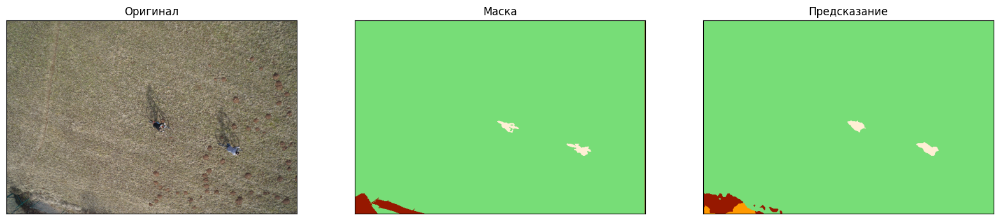

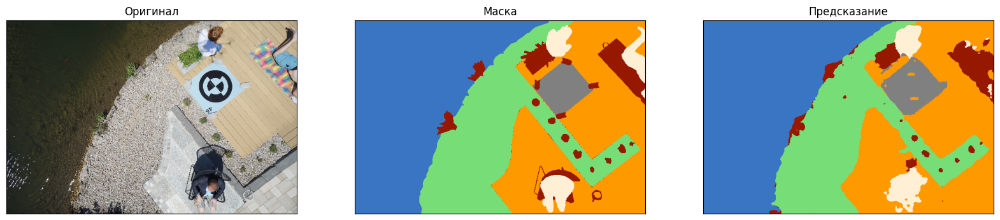

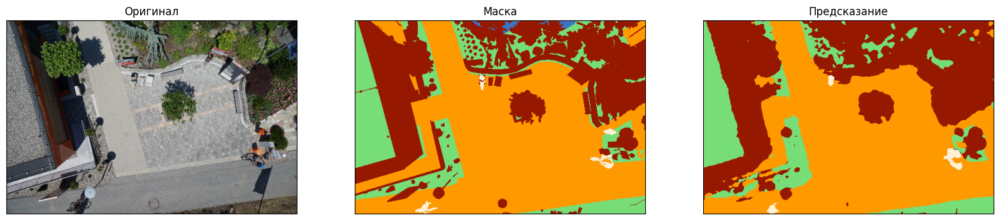

In [29]:
# Функция для отображения предсказаний
def plot_predictions(loader, model, cmap, num_samples = 5):
    model.eval()
    with torch.no_grad():
        data = next(iter(loader))
        images, labels = data
        images, labels = images.cuda(), labels.cuda()
        outputs = model(images)
        _, predictions = torch.max(outputs.data, 1)
        images, labels, predictions = images.cpu(), labels.cpu(), predictions.cpu()

        for i in range(num_samples):
            fig, ax = plt.subplots(1, 3, figsize=(20, 5))
            ax[0].imshow(np.transpose(images[i].numpy(), (1, 2, 0)))  # Оригинальное изображение
            ax[1].imshow(cmap[labels[i].numpy()])  # Метки
            ax[2].imshow(cmap[predictions[i].numpy()])  # Предсказание
            ax[0].set_title('Оригинал')
            ax[1].set_title('Маска')
            ax[2].set_title('Предсказание')
            for a in ax:
                a.get_xaxis().set_visible(False)
                a.get_yaxis().set_visible(False)
            plt.show()

# Использование новой цветовой карты для отображения предсказаний
plot_predictions(test_loader, model, cmap, 3)

In [20]:
# # Функция для сохранения предсказанных изображений
# def save_predictions(loader, model, cmap, save_dir):
#     model.eval()
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     image_dir = os.path.join(save_dir, 'images')
#     label_dir = os.path.join(save_dir, 'labels')
#     pred_dir = os.path.join(save_dir, 'predictions')

#     os.makedirs(image_dir, exist_ok=True)
#     os.makedirs(label_dir, exist_ok=True)
#     os.makedirs(pred_dir, exist_ok=True)

#     with torch.no_grad():
#         for idx, data in enumerate(loader):
#             images, labels = data
#             images, labels = images.cuda(), labels.cuda()
#             outputs = model(images)
#             _, predictions = torch.max(outputs.data, 1)
#             images, labels, predictions = images.cpu(), labels.cpu(), predictions.cpu()

#             for i in range(images.size(0)):
#                 image = np.transpose(images[i].numpy(), (1, 2, 0))
#                 label = cmap[labels[i].numpy()].astype(np.uint8)
#                 prediction = cmap[predictions[i].numpy()].astype(np.uint8)

#                 image_path = os.path.join(image_dir, f'image_{idx * loader.batch_size + i}.png')
#                 label_path = os.path.join(label_dir, f'label_{idx * loader.batch_size + i}.png')
#                 pred_path = os.path.join(pred_dir, f'pred_{idx * loader.batch_size + i}.png')

#                 plt.imsave(image_path, image)
#                 plt.imsave(label_path, label)
#                 plt.imsave(pred_path, prediction)

# # Использование функции для сохранения предсказанных изображений
# save_predictions(test_loader, model, cmap, 'predictions')


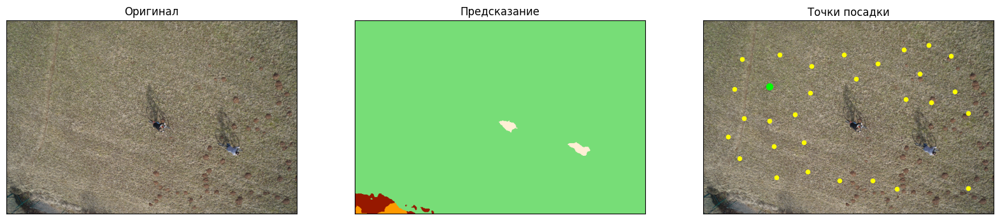

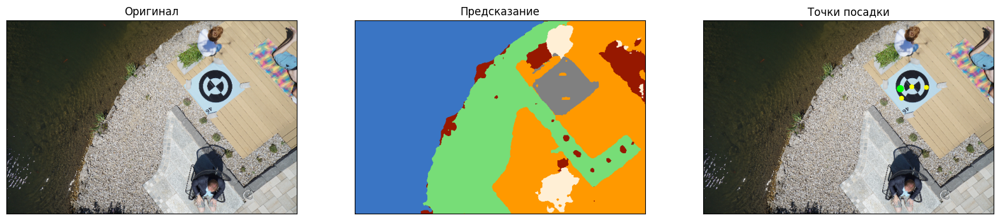

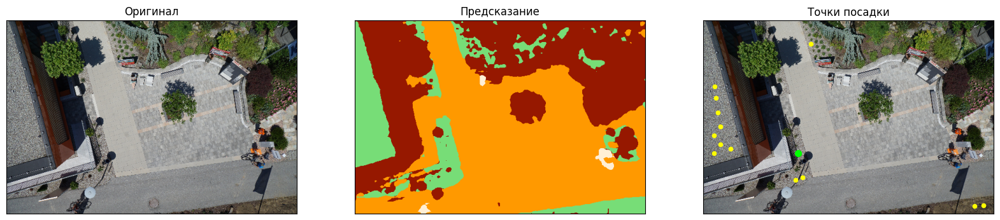

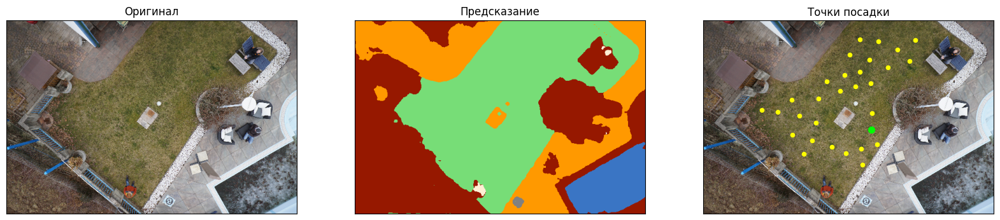

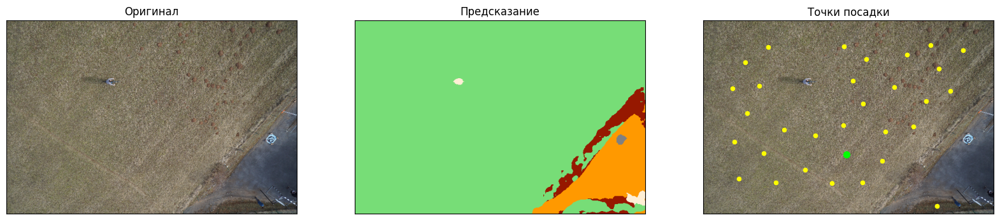

...

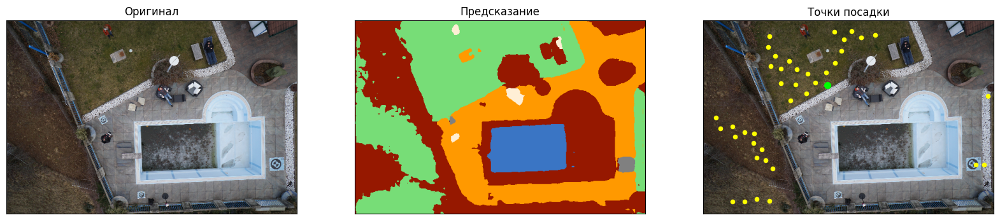

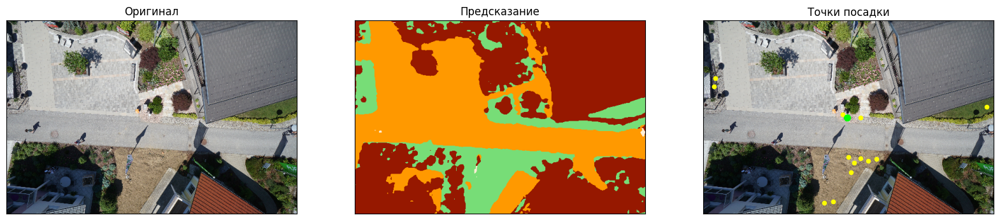

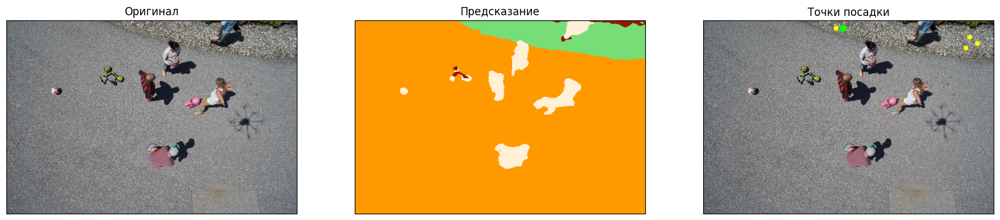

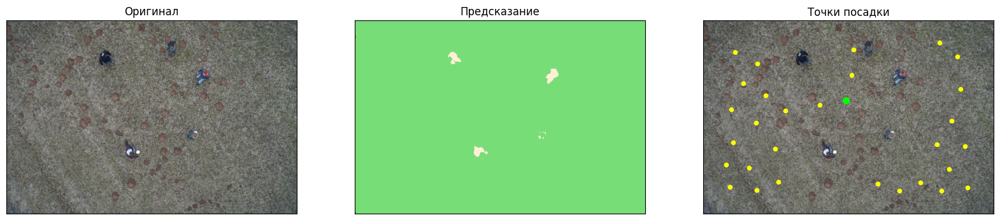

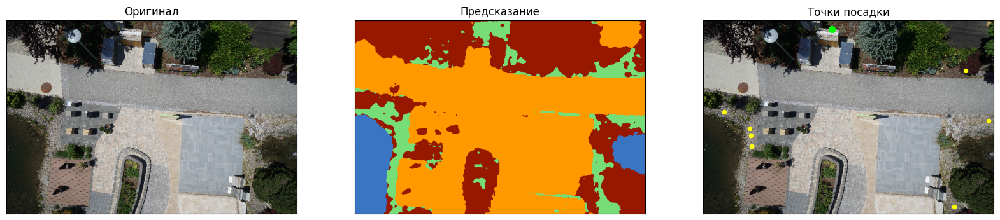

In [36]:
def filter_small_zones(mask, min_size=100):
    """Фильтрация масок, оставляя только зоны размером больше min_size."""
    num_labels, labels_im = cv2.connectedComponents(mask.astype(np.uint8))
    filtered_mask = np.zeros_like(mask)
    for label in range(1, num_labels):
        if np.sum(labels_im == label) > min_size:
            filtered_mask[labels_im == label] = 1
    return filtered_mask

def add_border(mask):
    """Добавление рамки вокруг изображения."""
    return np.pad(mask, pad_width=1, mode='constant', constant_values=0)

def find_multiple_furthest_points(mask, num_points):
    """Поиск множества самых дальних точек от краёв зоны."""
    furthest_points = []
    mask_copy = mask.copy()
    
    for _ in range(num_points):
        dist_transform = distance_transform_edt(mask_copy)
        max_dist = np.max(dist_transform)
        if max_dist == 0:
            break  # Прекращаем, если не осталось доступных точек
        
        max_dist_coords = np.unravel_index(np.argmax(dist_transform), dist_transform.shape)
        furthest_points.append((max_dist_coords, max_dist))
        
        # Помечаем найденную точку как границу, чтобы найти следующую наиболее дальнюю точку
        mask_copy[max_dist_coords] = 0
        
    return furthest_points

def dilate_mask(mask, kernel_size=15):
    """Расширение маски для увеличения границ объектов."""
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    dilated_mask = cv2.dilate(mask, kernel, iterations=1)
    return dilated_mask


# Переключение для взятия нескольких зон в расчёт
# zone_type = 'safe' |'road' | 'water' | 'roadandwater' | 'marker'
def get_zone_mask(pred, zone_type='safe', dilate_kernel_size=60):
    """Получение маски зоны в зависимости от типа и расширение масок движущихся объектов."""
    moving_objects_mask = (pred == 4).numpy().astype(np.uint8)
    dilated_moving_objects_mask = dilate_mask(moving_objects_mask, kernel_size=dilate_kernel_size)
    
    if zone_type == 'safe':
        zone_mask = ((pred == 1) | (pred == 5)).numpy().astype(np.uint8)
    elif zone_type == 'road':
        zone_mask = ((pred == 1) | (pred == 3) | (pred == 5)).numpy().astype(np.uint8)
    elif zone_type == 'water':
        zone_mask = ((pred == 1) | (pred == 2) | (pred == 5)).numpy().astype(np.uint8)
    elif zone_type == 'roadandwater':
        zone_mask = ((pred == 1) | (pred == 2) | (pred == 3) | (pred == 5)).numpy().astype(np.uint8)
    elif zone_type == 'marker':
        zone_mask = (pred == 5).numpy().astype(np.uint8)
    else:
        raise ValueError(f"Unknown zone_type: {zone_type}")

    # Исключение расширенных масок движущихся объектов из зоны
    zone_mask[dilated_moving_objects_mask == 1] = 0
    return zone_mask
    
# Переключения для нижней и передней камеры
# view_mode = 'forward' | 'bottom'
def calculate_score(point, zone_size, center_coords, img_shape, dist_from_edge, view_mode='bottom'):
    """Вычисление очков для точки на основе заданных критериев."""
    y, x = point

    if view_mode == 'forward':
        bottom_center_coords = (img_shape[0] - 1, img_shape[1] // 2)
        distance_from_reference = np.sqrt((x - bottom_center_coords[1])**2 + (y - bottom_center_coords[0])**2)
        distance_from_reference_norm = distance_from_reference / np.sqrt(img_shape[0]**2 + img_shape[1]**2)
    elif view_mode == 'bottom':
        distance_from_reference = np.sqrt((x - center_coords[1])**2 + (y - center_coords[0])**2)
        distance_from_reference_norm = distance_from_reference / np.sqrt(img_shape[0]**2 + img_shape[1]**2)
    else:
        raise ValueError(f"Неизвестный режим камеры: {view_mode}")

    size_score = zone_size / (img_shape[0] * img_shape[1])
    dist_from_edge_norm = dist_from_edge / np.max([img_shape[0], img_shape[1]])

    # Дистанция от центра изображения или от нижней части изображения, размер зоны и дистанция от краёв зоны
    score = 0.4 * (1 - distance_from_reference_norm) + 0.2 * size_score + 0.4 * dist_from_edge_norm
    return score

# Максимум количество точек в зоне
# num_points = 30
def plot_furthest_points(images, masks, preds, cmap, zone_type, num_points=30, view_mode='bottom'):
    model.eval()
    with torch.no_grad():
        for i in range(3):
            image = images[i]
            pred = preds[i]

            def process_zone(zone_type):
                zone_mask = get_zone_mask(pred, zone_type)
                zone_filtered = filter_small_zones(zone_mask)
                bordered_mask = add_border(zone_filtered)
                center_coords = (image.shape[1] // 2, image.shape[2] // 2)
                img_shape = image.shape[1:]  # (H, W)

                all_furthest_points = []
                num_labels, labels_im = cv2.connectedComponents(bordered_mask)
                for label in range(1, num_labels):
                    mask = (labels_im == label).astype(np.uint8)
                    zone_size = np.sum(mask)  # Размер зоны
                    num_zone_points = min(zone_size // 1500, num_points)  # Количество точек пропорционально размеру зоны
                    furthest_points = find_multiple_furthest_points(mask, num_zone_points)
                    # Удаление рамки из координат
                    furthest_points = [((point[0][0] - 1, point[0][1] - 1), point[1], zone_size) for point in furthest_points]
                    all_furthest_points.extend(furthest_points)

                all_furthest_points.sort(key=lambda p: calculate_score(p[0], p[2], center_coords, img_shape, p[1], view_mode))
                return all_furthest_points

            # Попытка найти точки в зоне 'safe'
            all_furthest_points = process_zone(zone_type)

            # Если не удалось найти ни одной точки, переключаемся на режим 'road'
            if len(all_furthest_points) == 0:
                all_furthest_points = process_zone('safe')

            # Если не удалось найти ни одной точки, переключаемся на режим 'road'
            if len(all_furthest_points) == 0:
                all_furthest_points = process_zone('road')

            fig, ax = plt.subplots(1, 3, figsize=(20, 5))
            ax[0].imshow(np.transpose(image.numpy(), (1, 2, 0)))  # Оригинальное изображение
            ax[1].imshow(cmap[pred.numpy()])  # Предсказанная маска
            ax[2].imshow(np.transpose(image.numpy(), (1, 2, 0)))  # Оригинальное изображение с точками

            for point, dist, _ in all_furthest_points[:-1]:
                ax[2].scatter(point[1], point[0], c='yellow', s=20)

            # Выделение самой оптимальной точки
            if len(all_furthest_points) > 0:
                best_point, best_dist, _ = all_furthest_points[-1]
                ax[2].scatter(best_point[1], best_point[0], c='lime', s=50)

            ax[0].set_title('Оригинал')
            ax[1].set_title('Предсказание')
            ax[2].set_title('Точки посадки')
            for a in ax:
                a.get_xaxis().set_visible(False)
                a.get_yaxis().set_visible(False)
            plt.show()

for data in test_loader:
    images, labels = data
    images, labels = images.cuda(), labels.cuda()
    outputs = model(images)
    _, preds = torch.max(outputs.data, 1)

    plot_furthest_points(images.cpu(), labels.cpu(), preds.cpu(), cmap, 'marker', 30, 'bottom')


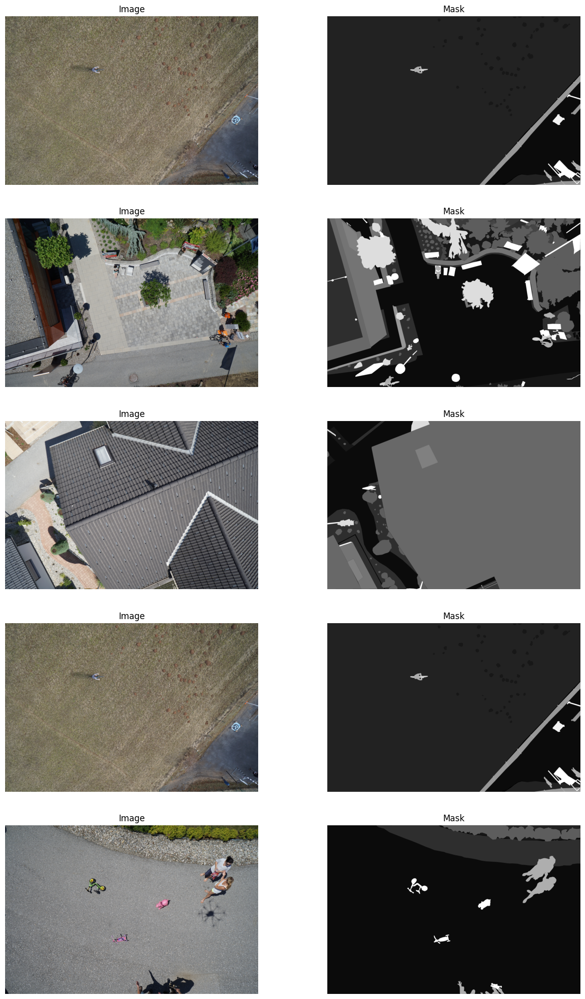

In [35]:
def display_samples(images, masks, num_samples=5):
    plt.figure(figsize=(15, num_samples * 5))
    for i in range(num_samples):
        idx = np.random.randint(0, len(images))
        img = cv2.imread(images[idx])
        mask = cv2.imread(masks[idx], cv2.IMREAD_GRAYSCALE)
        
        plt.subplot(num_samples, 2, 2 * i + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Image')
        plt.axis('off')

        plt.subplot(num_samples, 2, 2 * i + 2)
        plt.imshow(mask, cmap='gray')
        plt.title('Mask')
        plt.axis('off')
    plt.show()

# Вызов функции для отображения образцов изображений и масок
display_samples(img_test, mask_test, num_samples=3)

In [22]:
# Освобождение памяти GPU
gc.collect()
torch.cuda.empty_cache()